<a href="https://colab.research.google.com/github/thisissamuca/EIAPI/blob/main/Estudo_02.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Instalando bibliotecas**

In [ ]:
pip install tensorflow

In [ ]:
p install keras

In [ ]:
pip install Keras-Preprocessing

In [3]:
pip install aspose-words

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 67.5 MB 100 kB/s 


# **Importando bibliotecas**

In [3]:
import tensorflow as tf 
import keras
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pandas as pd
import os
import random
import shutil
import PIL
import re
import PIL.Image
import aspose.words as aw
from random import randint
from random import sample
from keras import preprocessing 
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import RMSprop
from keras.preprocessing import image
#from keras.preprocessing.image import load_img
from urllib.request import Request, urlopen
from google.colab import drive

In [4]:
drive.mount('/content/drive')

Mounted at /content/drive


# **Ajustando parâmetros**

In [91]:
image_width = 300
image_height = 300
image_color_channel = 3
image_color_channel_size = 255
image_size = (image_width, image_height)
image_shape = image_size + (image_color_channel, )

batch_size = 32
epochs = 5

class_names = ['quartz', 'pyrite']

# **Diretórios**

In [ ]:
base_dir = '/content/drive/MyDrive/EIAPI/datasets/dataset_ML_03'
test_dir = "./test/"
train_dir = "./train/"

# Diretório de treinamento

dataset_train_dir = os.path.join(base_dir, 'train')
dataset_train_quartz = os.path.join(dataset_train_dir, 'quartz')
dataset_train_pyrite = os.path.join(dataset_train_dir, 'pyrite')

# Diretorio de teste

dataset_test_dir = os.path.join(base_dir, 'test')
dataset_test_quartz = os.path.join(dataset_test_dir, 'quartz')
dataset_test_pyrite = os.path.join(dataset_test_dir, 'pyrite')

dataset_train = tf.keras.preprocessing.image_dataset_from_directory(
    dataset_train_dir,
    seed=123,
    image_size = image_size,
    batch_size = batch_size,
    shuffle = True
)

# Dataset Test

dataset_test = tf.keras.preprocessing.image_dataset_from_directory(
    dataset_test_dir,
    seed=123,
    image_size = image_size,
    batch_size = batch_size,
)

# Dataset Cardinality

dataset_test_cardinality = tf.data.experimental.cardinality(dataset_test)
dataset_test_batches = dataset_test_cardinality // 5

dataset_validation = dataset_test.take(dataset_test_batches)
dataset_test = dataset_test.skip(dataset_test_batches)

print('---')
print('Validation Dataset Cardinality: %d' % tf.data.experimental.cardinality(dataset_test))
print('Test Dataset Cardinality: %d' % tf.data.experimental.cardinality(dataset_validation))

class_names = dataset_train.class_names

print(class_names)

# **Plotagem predictic**

In [15]:
def predict(image_file):

    image = tf.keras.preprocessing.image.load_img(image_file, target_size = image_size)
    image = tf.keras.preprocessing.image.img_to_array(image)
    image = tf.expand_dims(image, 0)

    prediction = model.predict(image)[0][0]

    print(f'{round(prediction, 3) * 100}% Quartz | {round(1 - prediction, 1) * 100}% Pyrite')
    
#predict('image_file.jpg')

# **Novo treinamento**

## **Plotagens**

### **Função de plotagem**

<Figure size 432x288 with 0 Axes>

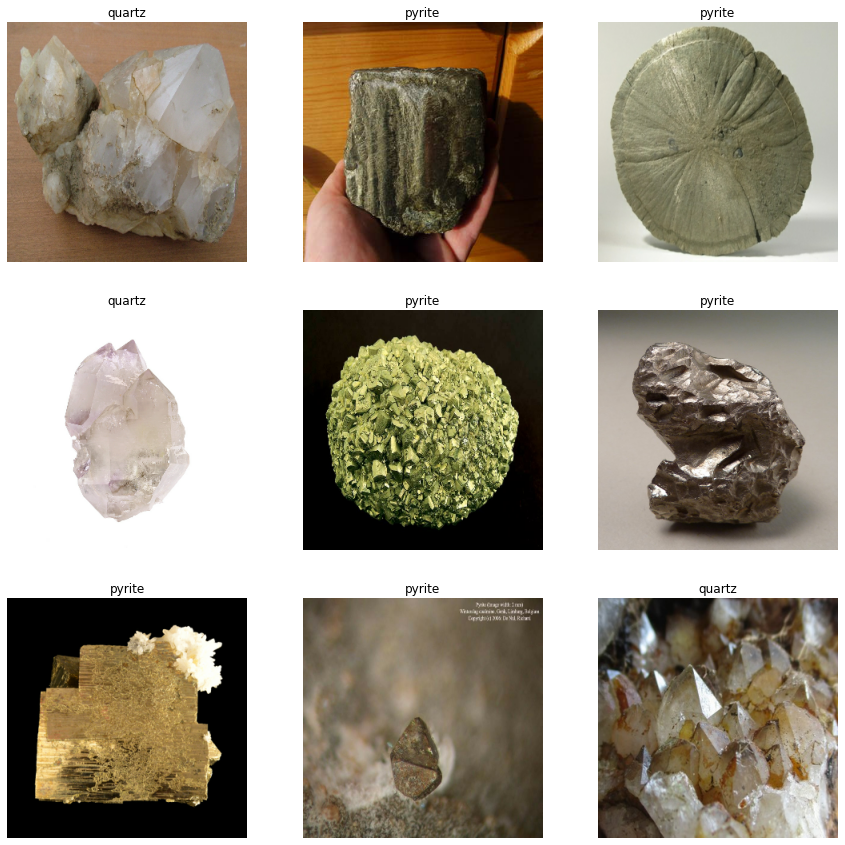

In [14]:
def plot_dataset(dataset):

    plt.gcf().clear()
    plt.figure(figsize = (15, 15))

    for features, labels in dataset.take(1):

        for i in range(9):

            plt.subplot(3, 3, i + 1)
            plt.axis('off')

            plt.imshow(features[i].numpy().astype('uint8'))
            plt.title(class_names[labels[i]])

plot_dataset(dataset_train)
#plot_dataset(dataset_validation)
#plot_dataset(dataset_test)

### **Plotagem de aprendizado**

In [24]:
def plot_model():

  acc = history.history['accuracy']
  val_acc = history.history['val_accuracy']

  loss = history.history['loss']
  val_loss = history.history['val_loss']

  plt.figure(figsize=(8, 8))
  plt.subplot(2, 1, 1)
  plt.plot(acc, label='Training Accuracy')
  plt.plot(val_acc, label='Validation Accuracy')
  plt.legend(loc='lower right')
  plt.ylabel('Accuracy')
  plt.ylim([min(plt.ylim()),1])
  plt.title('Training and Validation Accuracy')

  plt.subplot(2, 1, 2)
  plt.plot(loss, label='Training Loss')
  plt.plot(val_loss, label='Validation Loss')
  plt.legend(loc='upper right')
  plt.ylabel('Cross Entropy')
  plt.ylim([0,1.0])
  plt.title('Training and Validation Loss')
  plt.xlabel('epoch')
  
  plt.show()

## **Otimização**

In [18]:
autotune = tf.data.AUTOTUNE

dataset_train = dataset_train.prefetch(buffer_size = autotune)
dataset_train = dataset_train.prefetch(buffer_size = autotune)
dataset_test = dataset_train.prefetch(buffer_size = autotune)

## **Data augmentation**

In [19]:
data_augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomFlip('horizontal_and_vertical'),
    tf.keras.layers.RandomRotation(0.9),
    tf.keras.layers.RandomZoom(0.35)
])

## **Rescaling**

In [20]:
rescaling = tf.keras.layers.experimental.preprocessing.Rescaling(1. / (image_color_channel_size / 2.), offset = -1, input_shape = image_shape)

## **Early stopping**

In [21]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor = 'accuracy', patience = 3)

# **History**

In [49]:
model = tf.keras.models.load_model('/content/drive/MyDrive/EIAPI/models/model_01/model_01')

model.compile(
    optimizer = tf.keras.optimizers.RMSprop(learning_rate = 0.0001),
    loss = tf.keras.losses.BinaryCrossentropy(from_logits=True),
    metrics = ['accuracy']
)

history = model.fit(
    dataset_train,
    validation_data = dataset_validation,
    epochs = epochs,
    callbacks = [early_stopping] 
)

plot_model()

dataset_test_loss, dataset_test_accuracy = model.evaluate(dataset_test)

print('Dataset Test Loss:     %s' % dataset_test_loss)
print('Dataset Test Accuracy: %s' % dataset_test_accuracy)

# **Avaliando o modelo**

## **Selecionando arquivos**

In [103]:
base_dir = '/content/drive/MyDrive/EIAPI/minerals'

dataset_dir = os.path.join(base_dir)

dataset_mineral_dir = os.path.join(dataset_dir, 'pyrite')

photos = os.listdir(dataset_mineral_dir)

In [104]:
x = []

In [105]:
#for i in range(len(photos) - 1):

for i in range(100):

  if re.search(r'Pyrite', photos[i]):

    x.append(photos[i])

print(x)

['EAIPI_Pyrite_8339095.jpg', 'EAIPI_Pyrite_8339149.jpg', 'EAIPI_Pyrite_8339164.jpg', 'EAIPI_Pyrite_8339180.jpg', 'EAIPI_Pyrite_1035089.jpg', 'EAIPI_Pyrite_8433319.jpg', 'EAIPI_Pyrite_8433395.jpg', 'EAIPI_Pyrite_8449490.jpg', 'EAIPI_Pyrite_8449777.jpg', 'EAIPI_Pyrite_8465689.jpg', 'EAIPI_Pyrite_8554198.jpg', 'EAIPI_Pyrite_6129438.jpg', 'EAIPI_Pyrite_6424448.jpg', 'EAIPI_Pyrite_5431491.jpg', 'EAIPI_Pyrite_8806858.jpg', 'EAIPI_Pyrite_3335727.jpg', 'EAIPI_Pyrite_8871593.jpg', 'EAIPI_Pyrite_9139226.jpg', 'EAIPI_Pyrite_9139286.jpg', 'EAIPI_Pyrite_9139310.jpg', 'EAIPI_Pyrite_9139358.jpg', 'EAIPI_Pyrite_9140036.jpg', 'EAIPI_Pyrite_9141139.jpg', 'EAIPI_Pyrite_9142958.jpg', 'EAIPI_Pyrite_9143019.jpg', 'EAIPI_Pyrite_9143046.jpg', 'EAIPI_Pyrite_9161733.jpg', 'EAIPI_Pyrite_9161784.jpg', 'EAIPI_Pyrite_9305966.jpg', 'EAIPI_Pyrite_6811180.jpg', 'EAIPI_Pyrite_9503586.jpg', 'EAIPI_Pyrite_9537595.jpg', 'EAIPI_Pyrite_1957433.jpg', 'EAIPI_Pyrite_1821214.jpg', 'EAIPI_Pyrite_6967075.jpg', 'EAIPI_Pyrite_70341

## **Plotando**

In [106]:
y = []

for i in range(len(x) - 1):

  if re.search(r'Quartz', x[i]):

    image = tf.keras.preprocessing.image.load_img((f'/content/drive/MyDrive/EIAPI/minerals/quartz/{x[i]}') , target_size = image_size)
    image = tf.keras.preprocessing.image.img_to_array(image)
    image = tf.expand_dims(image, 0)
    prediction = model.predict(image)[0][0]

    y.append([round(prediction, 3), round(1 - prediction, 3)])

  if re.search(r'Pyrite', x[i]):

    image = tf.keras.preprocessing.image.load_img((f'/content/drive/MyDrive/EIAPI/minerals/pyrite/{x[i]}') , target_size = image_size)
    image = tf.keras.preprocessing.image.img_to_array(image)
    image = tf.expand_dims(image, 0)
    prediction = model.predict(image)[0][0]

    y.append([round(prediction, 3), round(1 - prediction, 3)])

print(y)

1/1 [==============================] - 0s 84ms/step
[[0.0, 1.0], [0.0, 1.0], [0.001, 0.999], [0.003, 0.997], [0.0, 1.0], [0.0, 1.0], [0.0, 1.0], [0.0, 1.0], [0.0, 1.0], [0.0, 1.0], [0.0, 1.0], [0.0, 1.0], [0.001, 0.999], [0.0, 1.0], [0.001, 0.999], [0.012, 0.988], [0.0, 1.0], [0.0, 1.0], [0.0, 1.0], [0.0, 1.0], [0.0, 1.0], [0.0, 1.0], [0.0, 1.0], [0.0, 1.0], [0.0, 1.0], [0.0, 1.0], [0.011, 0.989], [0.0, 1.0], [0.0, 1.0], [0.001, 0.999], [0.0, 1.0], [0.009, 0.991], [0.001, 0.999], [0.0, 1.0], [0.003, 0.997], [0.0, 1.0], [0.01, 0.99], [0.007, 0.993], [0.0, 1.0], [0.001, 0.999], [0.0, 1.0], [0.023, 0.977], [0.0, 1.0], [0.0, 1.0], [0.0, 1.0], [0.0, 1.0], [0.0, 1.0], [0.0, 1.0], [0.0, 1.0], [0.005, 0.995], [0.001, 0.999], [0.0, 1.0], [0.0, 1.0], [0.0, 1.0], [0.001, 0.999], [0.0, 1.0], [0.0, 1.0], [0.0, 1.0], [0.001, 0.999], [0.0, 1.0], [0.0, 1.0], [0.001, 0.999], [0.0, 1.0], [0.007, 0.993], [0.0, 1.0], [0.037, 0.963], [0.069, 0.931], [0.003, 0.997], [0.0, 1.0], [0.0, 1.0], [0.0, 1.0], [0.0,

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


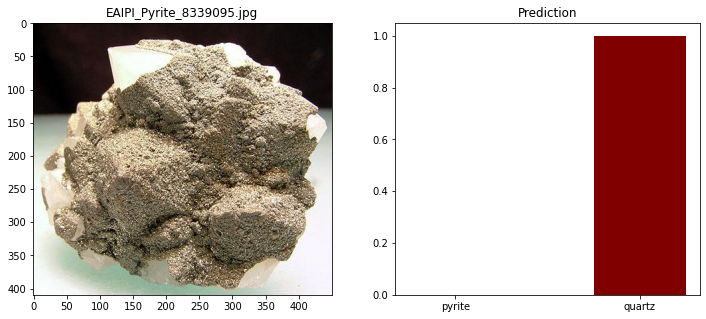

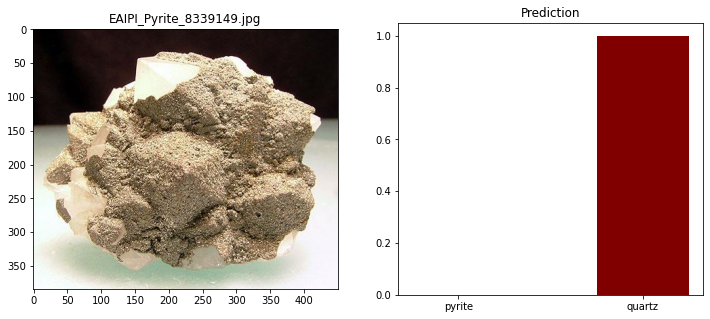

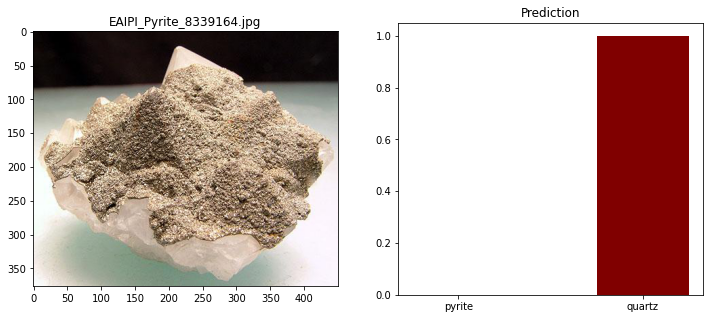

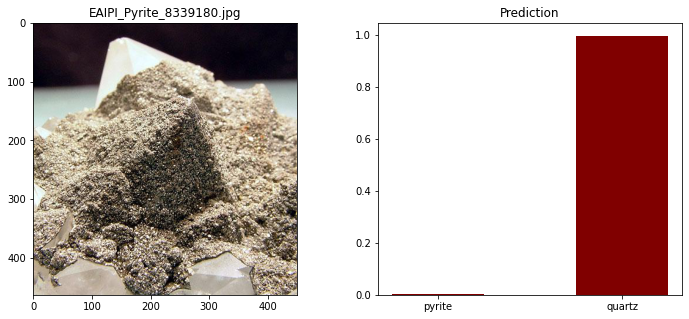

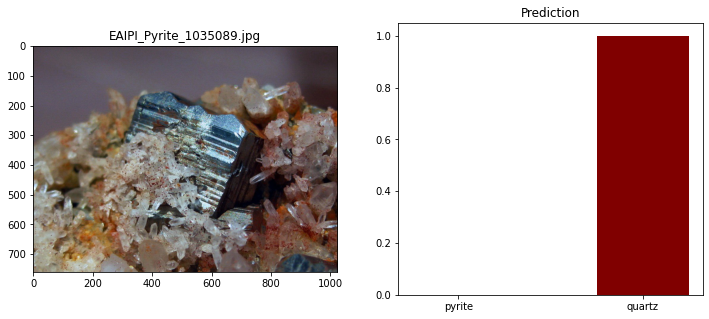

...

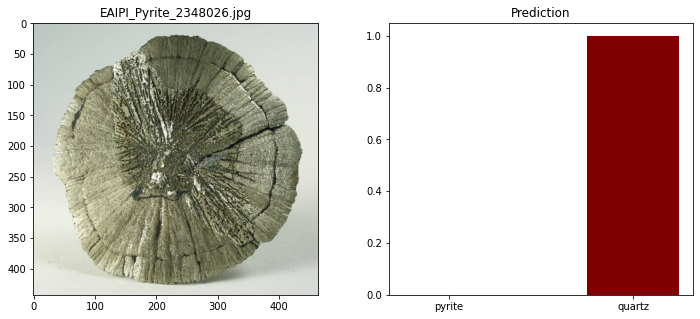

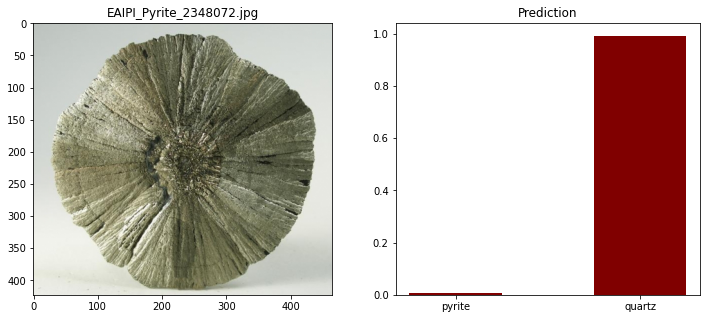

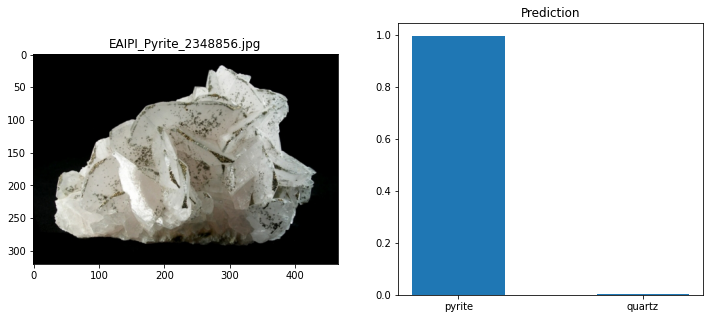

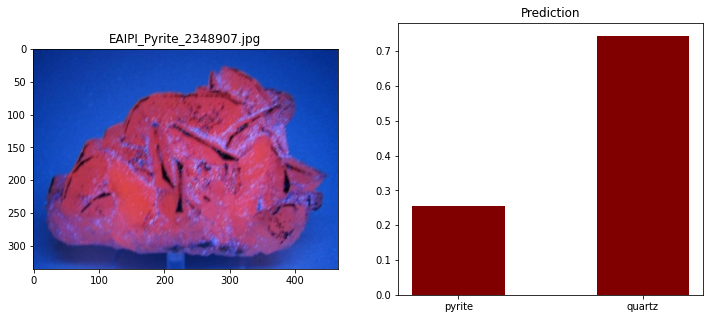

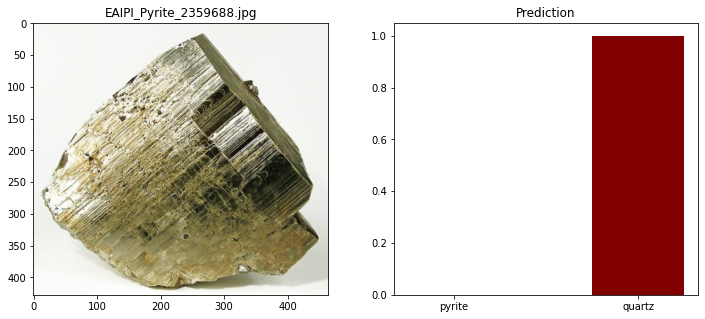

In [107]:
#doc = aw.Document()
#builder = aw.DocumentBuilder(doc)

for i in range(len(y) - 1):

  if re.search(r'Quartz', x[i]):

    img = mpimg.imread(f'/content/drive/MyDrive/EIAPI/minerals/quartz/{x[i]}')

    fig = plt.figure(figsize = (12, 5))

    ax = fig.add_subplot(1, 2, 1)

    imgplot = plt.imshow(img)

    ax.set_title(f'{x[i]}')

    ax = fig.add_subplot(1, 2, 2)

    if y[i][0] < .5:

      plt.bar(class_names, y[i], width = 0.5, color ='maroon')

    else:

      plt.bar(class_names, y[i], width = 0.5)

    ax.set_title('Prediction')

  if re.search(r'Pyrite', x[i]):

    img = mpimg.imread(f'/content/drive/MyDrive/EIAPI/minerals/pyrite/{x[i]}')

    fig = plt.figure(figsize = (12, 5))

    ax = fig.add_subplot(1, 2, 1)

    imgplot = plt.imshow(img)

    ax.set_title(f'{x[i]}')

    ax = fig.add_subplot(1, 2, 2)

    if y[i][0] < .5:

      plt.bar(class_names, y[i], width = 0.5, color ='maroon')

    else:

      plt.bar(class_names, y[i], width = 0.5)

    ax.set_title('Prediction')

#  plt.savefig(f'/content/drive/MyDrive/EIAPI/models/model_02/plots/plot_model_02_{i}.png')
#
#  builder.insert_image(f'/content/drive/MyDrive/EIAPI/models/model_02/plots/plot_model_02_{i}.png')
#
#doc.save('/content/drive/MyDrive/EIAPI/models/model_02/PDF/model_02_performance.pdf')

# **Salvando o modelo**

In [102]:
model.save('/content/drive/MyDrive/EIAPI/models/model_04')